
## Постановка задачи
Задача проекта состоит в решении [соревнования](https://www.kaggle.com/competitions/sp-society-camera-model-identification/data)

Задача, внутри соревнования: определить модель камеры (из набора возможных моделей) по одному входному изображению.

**Цель:**  
Цель проекта — распознать модель камеры по изображению с использованием современных методов глубинного обучения.  
- В соревновании используется задача многоклассовой классификации.  
- Датасет содержит изображения, полученные с различных моделей камер.  
- Необходимо разработать модель, которая сможет с высокой точностью предсказывать модель камеры по входному изображению.  

**Метрика:**  
- В соревновании используется метрика взвешенная точность (weighted accuracy). Это означает, что не все примеры из тестовой выборки учитываются одинаково
- Цель состоит в том, чтобы максимизировать эту взвешенную точность.

**Задачи:**  
1. Провести EDA
2. Построить базовую модель
3. Реализовать улучшенные подходы с использованием современных архитектур
4. Провести анализ ошибок и содержательное сравнение моделей


Убрать потом Собственное решение соревенования основано на архитектуре Swin Transformers

In [2]:
import torch
print(torch.backends.mps.is_available())  # True — MPS доступен
print(torch.backends.mps.is_built())      # True — PyTorch собран с поддержкой MPS

True
True


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Настройка Kaggle

In [ ]:
import os
import shutil

os.makedirs('/root/.kaggle', exist_ok=True)
shutil.move('/content/kaggle.json', '/root/.kaggle/kaggle.json')
os.chmod('/root/.kaggle/kaggle.json', 0o600)
print("Kaggle API настроен!")

Kaggle API настроен!


In [ ]:
!pip install kaggle

In [ ]:
!kaggle competitions list

ref                                                                                deadline             category                reward  teamCount  userHasEntered  
---------------------------------------------------------------------------------  -------------------  ---------------  -------------  ---------  --------------  
https://www.kaggle.com/competitions/ai-mathematical-olympiad-progress-prize-2      2025-04-01 23:59:00  Featured         2,117,152 Usd       2257           False  
https://www.kaggle.com/competitions/stanford-rna-3d-folding                        2025-05-29 23:59:00  Featured            75,000 Usd        699           False  
https://www.kaggle.com/competitions/byu-locating-bacterial-flagellar-motors-2025   2025-06-04 23:59:00  Research            65,000 Usd        432           False  
https://www.kaggle.com/competitions/drawing-with-llms                              2025-05-27 23:59:00  Featured            50,000 Usd        454           False  
https://www.kagg

In [ ]:
!kaggle competitions download -c sp-society-camera-model-identification

^C


In [ ]:
import zipfile

os.makedirs('/content/dataset', exist_ok=True)
with zipfile.ZipFile('/content/sp-society-camera-model-identification.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')
print("Данные успешно разархивированы!")

#Подключение библиотек, настройка устройства

In [5]:
!pip install timm pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 30.1 MB/s eta 0:00:00 0:00:01


In [4]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset, random_split
from timm import create_model
import pandas as pd
from PIL import Image
import os
import time

# Step 1: Device Configuration
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)

mps


#Загрузка данных

In [23]:
data = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"
classes = sorted([d for d in os.listdir(data) if os.path.isdir(os.path.join(data, d))])
print("Классы:", classes)

Классы: ['HTC-1-M7', 'LG-Nexus-5x', 'Motorola-Droid-Maxx', 'Motorola-Nexus-6', 'Motorola-X', 'Samsung-Galaxy-Note3', 'Samsung-Galaxy-S4', 'Sony-NEX-7', 'iPhone-4s', 'iPhone-6']


#EDA на необработанных данных

In [5]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

Средняя ширина: 3454.18, Средняя высота: 2865.50


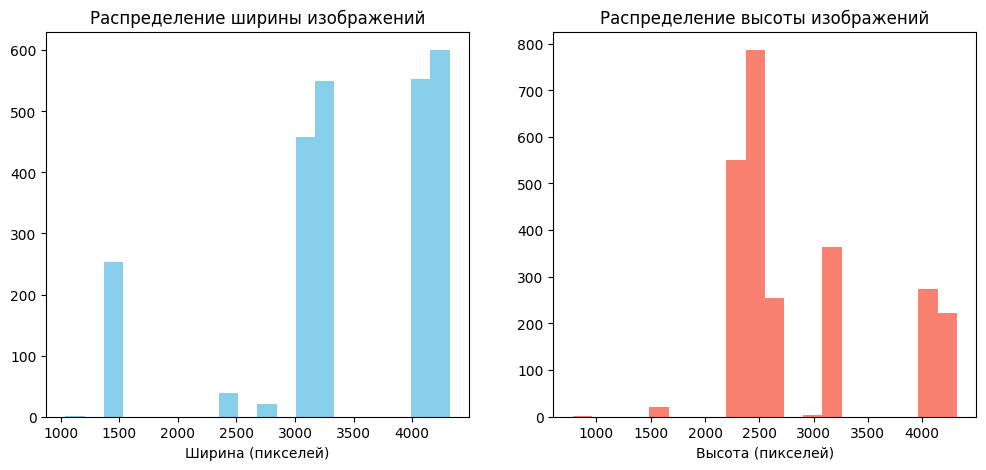

In [ ]:
# 1. Статистика по размерам изображений

image_sizes = []
for root, _, files in os.walk(data):
    for file in files:
        if file.endswith((".jpg", ".png", ".tif")):
            img_path = os.path.join(root, file)
            try:
                with Image.open(img_path) as img:
                    image_sizes.append(img.size)
            except Exception as e:
                print(f"Ошибка при открытии {img_path}: {e}")

# Извлекаем ширину и высоту
if image_sizes:
    widths, heights = zip(*image_sizes)
    print(f"Средняя ширина: {np.mean(widths):.2f}, Средняя высота: {np.mean(heights):.2f}")

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(widths, bins=20, color='skyblue')
    plt.title("Распределение ширины изображений")
    plt.xlabel("Ширина (пикселей)")

    plt.subplot(1, 2, 2)
    plt.hist(heights, bins=20, color='salmon')
    plt.title("Распределение высоты изображений")
    plt.xlabel("Высота (пикселей)")
    plt.show()
else:
    print("Не удалось собрать информацию о размерах изображений.")


Изображения имеют достаточно высокое разрешение, и оно заметно варьируется. Это подтверждает необходимость ресайза, чтобы подать данные в нейронную сеть

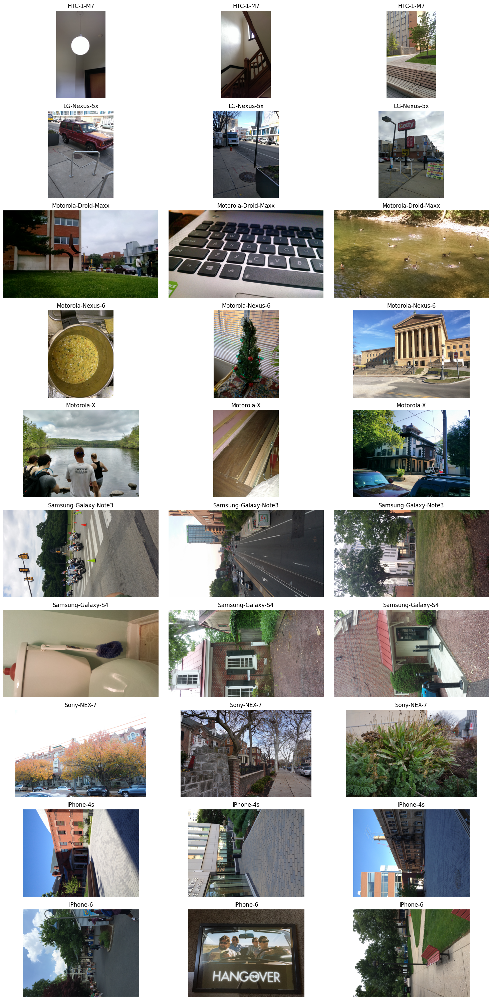

In [ ]:
# 2. Визуализация примеров изображений для каждого класса

def display_raw_samples(image_dir, classes, num_samples=3):
    plt.figure(figsize=(15, len(classes)*3))
    for i, cls in enumerate(classes):
        cls_path = os.path.join(image_dir, cls)
        image_files = [f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".png", ".tif", ".jpeg"))]
        # Выберем первые num_samples изображений
        for j, fname in enumerate(image_files[:num_samples]):
            file_path = os.path.join(cls_path, fname)
            try:
                img = Image.open(file_path)
                ax = plt.subplot(len(classes), num_samples, i*num_samples + j + 1)
                plt.imshow(img)
                plt.title(f"{cls}")
                plt.axis("off")
            except Exception as e:
                print(f"Ошибка открытия {file_path}: {e}")
    plt.tight_layout()
    plt.show()

display_raw_samples(data, classes, num_samples=3)


In [ ]:
!pip install exifread

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.4/40.4 kB 2.5 MB/s eta 0:00:00


In [ ]:
# 3. Чтение и вывод EXIF-метаданных для одного изображения
import exifread

# Проходим по поддиректориям и выбираем первый найденный файл изображения
sample_img_path = None
for subdir in os.listdir(data):
    subdir_path = os.path.join(data, subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            if file.lower().endswith((".jpg", ".png", ".tif", ".jpeg")):
                sample_img_path = os.path.join(subdir_path, file)
                break
    if sample_img_path is not None:
        break

if sample_img_path is not None:
    with open(sample_img_path, 'rb') as f:
        tags = exifread.process_file(f)
    print("EXIF-теги первого изображения:")
    for tag, value in tags.items():
        print(f"{tag}: {value}")
else:
    print("Файл изображения не найден.")



EXIF-теги первого изображения:
Image ImageWidth: 4128
Image ImageLength: 2322
Image Make: samsung
Image Model: SCH-I545
Image Orientation: Rotated 90 CW
Image XResolution: 72
Image YResolution: 72
Image ResolutionUnit: Pixels/Inch
Image Software: I545VRUGOC1
Image DateTime: 2015:06:05 10:11:01
Image YCbCrPositioning: Centered
Image ExifOffset: 224
Thumbnail ImageWidth: 512
Thumbnail ImageLength: 288
Thumbnail Compression: JPEG (old-style)
Thumbnail Orientation: Rotated 90 CW
Thumbnail XResolution: 72
Thumbnail YResolution: 72
Thumbnail ResolutionUnit: Pixels/Inch
Thumbnail JPEGInterchangeFormat: 5102
Thumbnail JPEGInterchangeFormatLength: 11618
EXIF ExposureTime: 1/15
EXIF FNumber: 11/5
EXIF ExposureProgram: Program Normal
EXIF ISOSpeedRatings: 320
EXIF ExifVersion: 0220
EXIF DateTimeOriginal: 2015:06:05 10:11:01
EXIF DateTimeDigitized: 2015:06:05 10:11:01
EXIF ComponentsConfiguration: YCbCr
EXIF ShutterSpeedValue: 256007/65536
EXIF ApertureValue: 57/25
EXIF BrightnessValue: -23/64
EXI

В EXIF-тегах чётко прописаны Image Make и Image Model (например, samsung / SCH-I545), а также масса другой информации: дата съёмки, ориентация, фокусное расстояние и т.д.



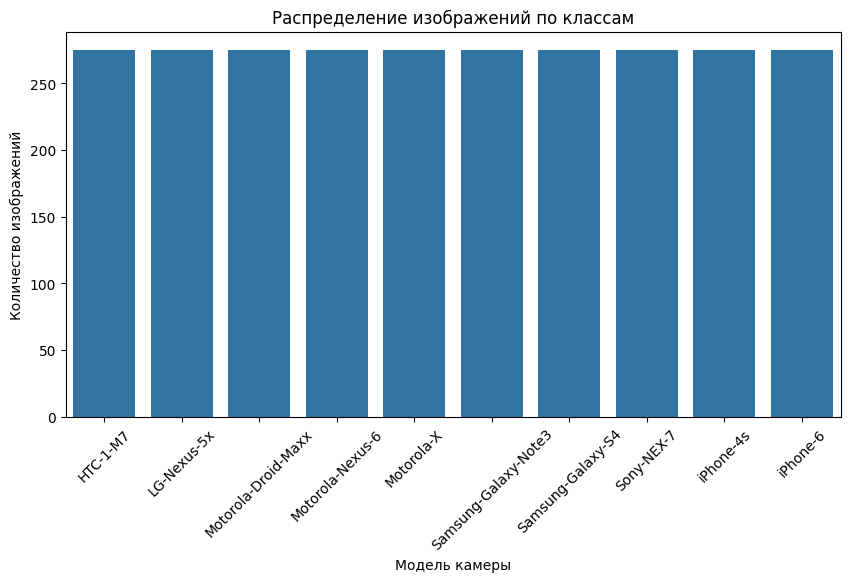

In [ ]:
class_counts_dict = {}
for cls in classes:
    cls_path = os.path.join(data, cls)
    # Фильтруем файлы по расширению (можно добавить нужные расширения)
    image_files = [f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp"))]
    class_counts_dict[cls] = len(image_files)

# Создадим pandas Series для удобства визуализации
class_counts = pd.Series(class_counts_dict).sort_index()

# Визуализация распределения изображений по классам
plt.figure(figsize=(10, 5))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title("Распределение изображений по классам")
plt.xlabel("Модель камеры")
plt.ylabel("Количество изображений")
plt.xticks(rotation=45)
plt.show()

Можем видеть что все классы сбалансированы и в них равное кол-во изображений

                  Class  Count    Avg_Width   Avg_Height   Std_Width  \
0              HTC-1-M7    275  1609.192727  2598.807273  310.196330   
1           LG-Nexus-5x    275  3034.996364  4021.003636  104.706325   
2   Motorola-Droid-Maxx    275  4052.247273  2699.752727  658.654406   
3      Motorola-Nexus-6    275  3602.210909  3654.916364  542.739716   
4            Motorola-X    275  4004.945455  3275.054545  370.425182   
5  Samsung-Galaxy-Note3    275  4128.000000  2322.000000    0.000000   
6     Samsung-Galaxy-S4    275  4128.000000  2322.000000    0.000000   
7            Sony-NEX-7    275  6000.000000  4000.000000    0.000000   
8             iPhone-4s    275  3264.000000  2448.000000    0.000000   
9              iPhone-6    275  3264.000000  2448.000000    0.000000   

   Std_Height  
0  310.196330  
1  104.706325  
2  658.654406  
3  547.677573  
4  370.425182  
5    0.000000  
6    0.000000  
7    0.000000  
8    0.000000  
9    0.000000  


<ipython-input-30-e3b4e796c022>:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Avg_Width', data=df, palette="viridis")


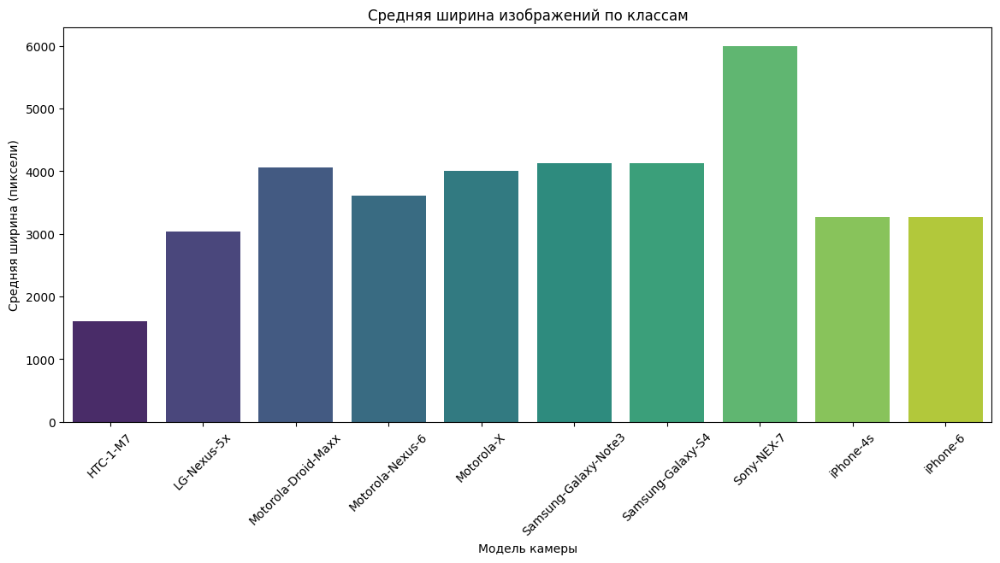

<ipython-input-30-e3b4e796c022>:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Class', y='Avg_Height', data=df, palette="viridis")


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'HTC-1-M7'),
  Text(1, 0, 'LG-Nexus-5x'),
  Text(2, 0, 'Motorola-Droid-Maxx'),
  Text(3, 0, 'Motorola-Nexus-6'),
  Text(4, 0, 'Motorola-X'),
  Text(5, 0, 'Samsung-Galaxy-Note3'),
  Text(6, 0, 'Samsung-Galaxy-S4'),
  Text(7, 0, 'Sony-NEX-7'),
  Text(8, 0, 'iPhone-4s'),
  Text(9, 0, 'iPhone-6')])

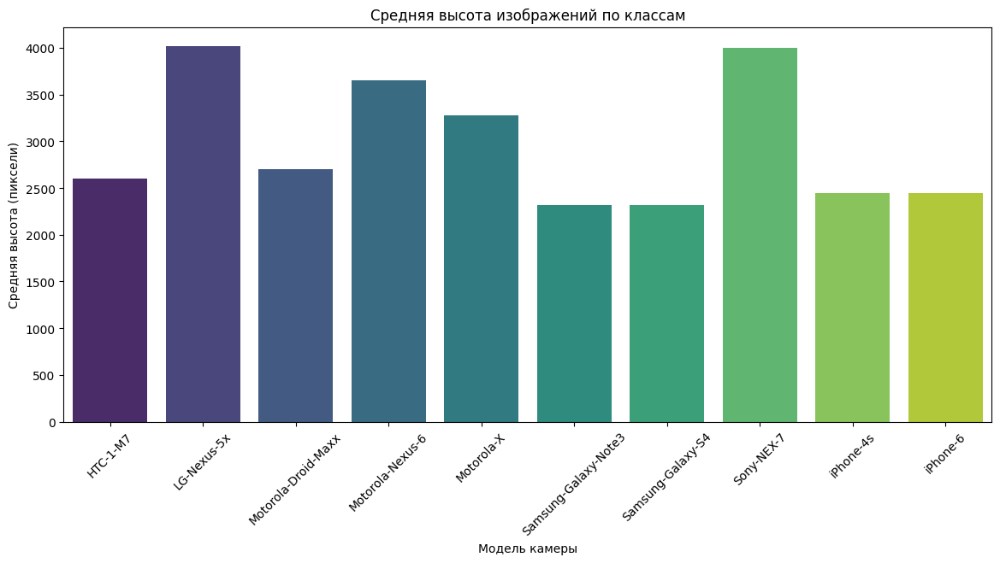

In [ ]:
# Собираем статистику по размерам для каждого класса
stat = []
for cls in classes:
    cls_path = os.path.join(data, cls)
    # Фильтруем файлы по расширению изображений
    image_files = [f for f in os.listdir(cls_path) if f.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp"))]

    widths = []
    heights = []

    for fname in image_files:
        file_path = os.path.join(cls_path, fname)
        try:
            with Image.open(file_path) as img:
                w, h = img.size
                widths.append(w)
                heights.append(h)
        except Exception as e:
            print(f"Ошибка открытия {file_path} в классе {cls}: {e}")

    if widths and heights:
        avg_width = np.mean(widths)
        avg_height = np.mean(heights)
        std_width = np.std(widths)
        std_height = np.std(heights)
        count = len(widths)
    else:
        avg_width = avg_height = std_width = std_height = 0
        count = 0

    stat.append({
        'Class': cls,
        'Count': count,
        'Avg_Width': avg_width,
        'Avg_Height': avg_height,
        'Std_Width': std_width,
        'Std_Height': std_height
    })

# Преобразуем список в DataFrame для удобства
df = pd.DataFrame(stat)
print(df)

# Визуализация средней ширины по классам
plt.figure(figsize=(14, 6))
sns.barplot(x='Class', y='Avg_Width', data=df, palette="viridis")
plt.title("Средняя ширина изображений по классам")
plt.xlabel("Модель камеры")
plt.ylabel("Средняя ширина (пиксели)")
plt.xticks(rotation=45)
plt.show()

# Визуализация средней высоты по классам
plt.figure(figsize=(14, 6))
sns.barplot(x='Class', y='Avg_Height', data=df, palette="viridis")
plt.title("Средняя высота изображений по классам")
plt.xlabel("Модель камеры")
plt.ylabel("Средняя высота (пиксели)")
plt.xticks(rotation=45)

#Обработка данных

In [42]:
from torchvision import datasets, transforms

transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [56]:
assert callable(transform_train), "Transform не создаётся корректно!"

In [49]:
from torchvision.datasets import ImageFolder

#Загрузка с диска
full_train_dataset = ImageFolder(root="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train")
#full_train_dataset = ImageFolder(root="/content/drive/MyDrive/Datasets/sp-society-camera-model-identification/train/train", transform=transform_train)

In [50]:
full_train_dataset.classes

['HTC-1-M7',
 'LG-Nexus-5x',
 'Motorola-Droid-Maxx',
 'Motorola-Nexus-6',
 'Motorola-X',
 'Samsung-Galaxy-Note3',
 'Samsung-Galaxy-S4',
 'Sony-NEX-7',
 'iPhone-4s',
 'iPhone-6']

Разделим тренировочные данные на обучающую выборку и валидационную

In [57]:
class_names = full_train_dataset.classes  # Mapping from index to class name
train_size = int(0.8 * len(full_train_dataset))  # 80% for training
val_size = len(full_train_dataset) - train_size  # 20% for validation
train_dataset, val_dataset = random_split(full_train_dataset, [train_size, val_size])
train_dataset.dataset.transform = transform_train
val_dataset.dataset.transform = transform_test

train_loader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True, num_workers=0)
val_loader = DataLoader(dataset=val_dataset, batch_size=32, shuffle=False, num_workers=0)

In [58]:
pd.Series(train_dataset.dataset.targets).value_counts()

0    275
1    275
2    275
3    275
4    275
5    275
6    275
7    275
8    275
9    275
Name: count, dtype: int64

#EDA на данных после обработки


In [59]:
for images, labels in train_loader:
    print("Batch labels:", labels.numpy())
    break

Batch labels: [8 1 0 5 4 4 0 6 5 6 1 3 0 5 4 9 5 0 3 9 6 2 4 4 3 3 5 0 5 3 5 8]


In [60]:
# 1. Вывод статистик по цветовым каналам после ресайза
means = []
stds = []
for images, _ in train_loader:
    means.append(images.mean(dim=[0, 2, 3]).cpu().numpy())
    stds.append(images.std(dim=[0, 2, 3]).cpu().numpy())
    break  # анализируем один батч

means = np.array(means).mean(axis=0)
stds = np.array(stds).mean(axis=0)
print("Статистика по каналам (после ресайза):")
print("Средние (RGB):", means)
print("Стандартное отклонение (RGB):", stds)

Статистика по каналам (после ресайза):
Средние (RGB): [-0.12760174  0.02148205  0.09759038]
Стандартное отклонение (RGB): [1.0592768 1.0469615 1.1510043]


Значения [ −0.1698, −0.1186, 0.0163]  [ −0.1698, −0.1186, 0.0163] означают, что после применения нормализации (с использованием средних
[ 0.485, 0.456, 0.406]
[ 0.485, 0.456, 0.406] и стандартных отклонений
[ 0.229, 0.224, 0.225]
[ 0.229, 0.224, 0.225] для ImageNet) распределение значений пикселей стало примерно центрированным около нуля.


Значения
[
1.181
,
1.191
,
1.225
]
[1.181,1.191,1.225] показывают, что разброс значений пикселей по каждому каналу составляет примерно 1.2.

Эти значения говорят о том, что предобработка данных (ресайз и нормализация) выполнена правильно


In [6]:
pip install matplotlib

Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/Users/natalia/Documents/Учеба/Deep_Learning/Проект новый/Project/venv/lib/python3.13/site-packages/pip/__main__.py", line 22, in <module>
    from pip._internal.cli.main import main as _main
  File "/Users/natalia/Documents/Учеба/Deep_Learning/Проект новый/Project/venv/lib/python3.13/site-packages/pip/_internal/cli/main.py", line 11, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/Users/natalia/Documents/Учеба/Deep_Learning/Проект новый/Project/venv/lib/python3.13/site-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/Users/natalia/Documents/Учеба/Deep_Learning/Проект новый/Project/venv/lib/python3.13/site-packages/pip/_internal/cli/main_parser.py", line 9, in <module>
    from pip._internal.build_env import ge

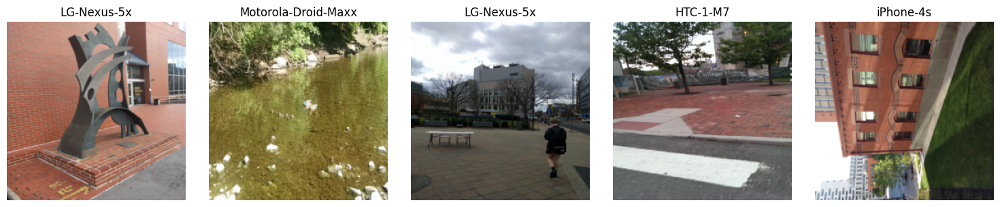

In [64]:
# 2. Визуализация примеров изображений из DataLoader (после трансформаций)
import matplotlib.pyplot as plt

def show_processed_images(loader, class_names, num_images=5):
    images, labels = next(iter(loader))
    images = images.permute(0, 2, 3, 1).cpu().numpy()  # (B, H, W, C)
    plt.figure(figsize=(15, 3))
    for i in range(num_images):
        ax = plt.subplot(1, num_images, i+1)
        # Если изображения нормализованы, можно восстановить их для корректного отображения
        img = images[i] * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        plt.imshow(img)
        plt.title(f"{class_names[labels[i].item()]}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

show_processed_images(train_loader, full_train_dataset.classes, num_images=5)

Изображения выглядят естественно, цвета восстановлены, а размер единообразен

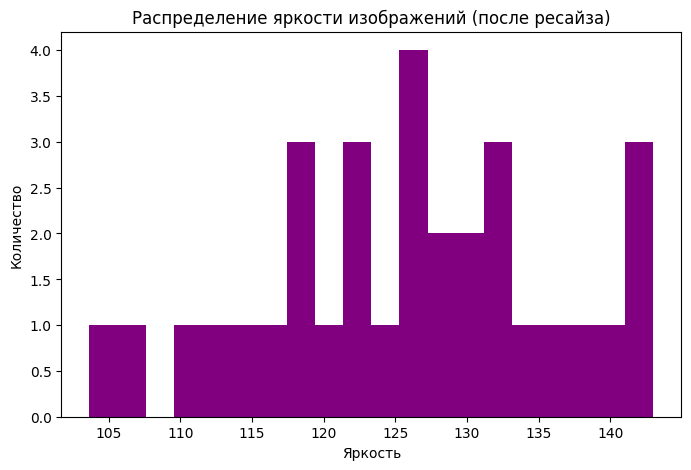

In [ ]:
# 3. Анализ яркости изображений после ресайза

def compute_brightness_tensor(image_tensor):
    # image_tensor имеет форму (C, H, W), переведем в PIL Image для простоты
    img = transforms.ToPILImage()(image_tensor)
    gray = np.array(img.convert('L'))
    return gray.mean()

brightness_values = []
for images, _ in train_loader:
    for img_tensor in images:
        brightness_values.append(compute_brightness_tensor(img_tensor))
    break  # берем один батч

plt.figure(figsize=(8, 5))
plt.hist(brightness_values, bins=20, color='purple')
plt.title("Распределение яркости изображений (после ресайза)")
plt.xlabel("Яркость")
plt.ylabel("Количество")
plt.show()

Яркость снимков после ресайза имеет довольно компактное распределение (в районе 110–140), и лишь несколько изображений выпадают из общего коридора

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


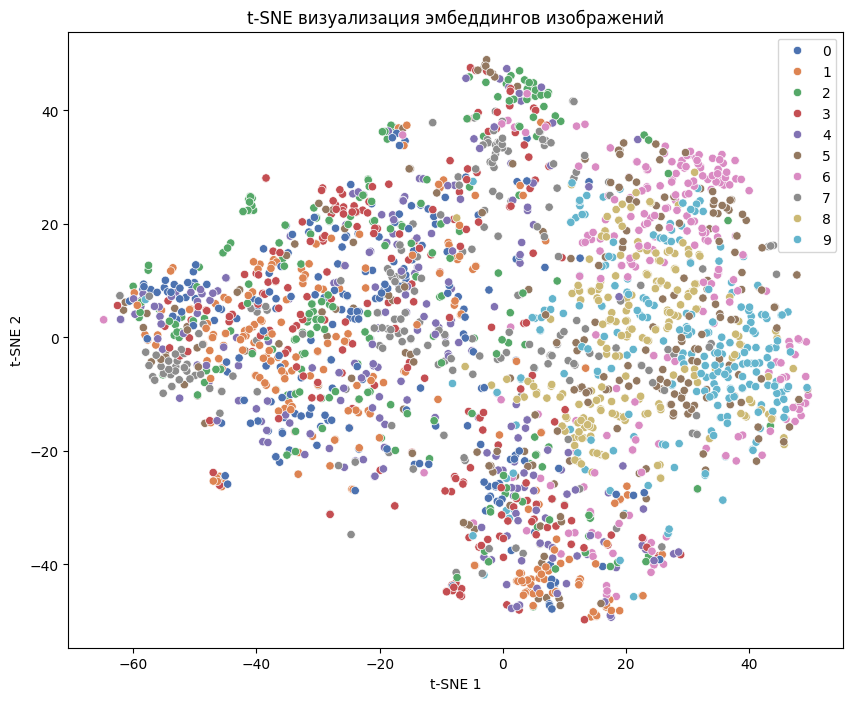

In [ ]:
# Визуализируем данные в пространстве

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

# Используем предобученную модель для извлечения признаков (удаляем финальный классификатор)
baseline_model = create_model('resnet18', pretrained=True)
baseline_model.fc = torch.nn.Identity()
baseline_model = baseline_model.to(device)
baseline_model.eval()

features = []
labels_list = []
with torch.no_grad():
    for images, labels in train_loader:
        images = images.to(device)
        feats = baseline_model(images)
        features.append(feats.cpu())
        labels_list.extend(labels.numpy())
        # Ограничимся несколькими батчами для быстроты
        if len(features) >= 100:
            break

features = torch.cat(features, dim=0).numpy()

# Сначала уменьшаем размерность с помощью PCA до 50
pca = PCA(n_components=50)
pca_result = pca.fit_transform(features)

# Затем применяем t-SNE для визуализации в 2D
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(pca_result)

plt.figure(figsize=(10, 8))
sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=labels_list, palette="deep", legend="full")
plt.title("t-SNE визуализация эмбеддингов изображений")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

Некоторые классы частично кластеризуются, но разделение не идеальное: много смешанных точек разных цветов


#Обработка тестового датасета

In [80]:
class CustomTestDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.data = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.data.iloc[idx, 0])
        image = Image.open(img_name).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, self.data.iloc[idx, 0]

#Создание базовой модели ResNet18


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
import timm

In [8]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

Используем устройство: mps


In [70]:
num_classes = len(class_names)
print("Количество классов:", num_classes)

Количество классов: 10


In [71]:
# Создаем базовую модель EfficientNet‑B0 с предобученными весами
baseline_model = timm.create_model('efficientnet_b0', pretrained=True)

In [72]:
# Извлекаем число признаков из финального классификационного слоя EfficientNet‑B0
# В timm для EfficientNet‑B0 финальный слой называется 'classifier'
num_features = baseline_model.classifier.in_features

In [73]:
# Заменяем финальный классификатор на линейный слой, дающий num_classes выходов
baseline_model.classifier = nn.Linear(num_features, num_classes)
baseline_model = baseline_model.to(device)

In [74]:
# Определяем функцию потерь и оптимизатор
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(baseline_model.parameters(), lr=1e-4)

In [75]:
num_epochs = 5

In [76]:
for epoch in range(num_epochs):
    baseline_model.train()
    running_loss = 0.0
    total_train = 0
    correct_train = 0

    # Обучающий цикл
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = baseline_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (preds == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    baseline_model.eval()
    running_val_loss = 0.0
    total_val = 0
    correct_val = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = baseline_model(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (preds == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Сохраняем baseline модель для дальнейших экспериментов
torch.save(baseline_model.state_dict(), "efficientnet_b0_baseline.pth")
print("Baseline модель сохранена как efficientnet_b0_baseline.pth")

Epoch 1/5: Train Loss: 2.0102, Train Acc: 0.3177, Val Loss: 1.6234, Val Acc: 0.4982
Epoch 2/5: Train Loss: 1.2319, Train Acc: 0.6959, Val Loss: 1.1099, Val Acc: 0.6818
Epoch 3/5: Train Loss: 0.6435, Train Acc: 0.8432, Val Loss: 0.7118, Val Acc: 0.7673
Epoch 4/5: Train Loss: 0.2945, Train Acc: 0.9359, Val Loss: 0.5486, Val Acc: 0.8345
Epoch 5/5: Train Loss: 0.1333, Train Acc: 0.9800, Val Loss: 0.4892, Val Acc: 0.8473
Baseline модель сохранена как efficientnet_b0_baseline.pth


#Перейдем к улучшению модели

Epoch 5/5: Train Loss: 0.1384, Train Acc: 0.9782, Val Loss: 0.4665, Val Acc: 0.8400

Обучающая точность очень высокая (около 97–98%), а валидационная ниже (около 84%). Это говорит о том, что модель переобучается на тренировочных данных.


Добавление аугментаций (например, RandomResizedCrop, RandomHorizontalFlip, RandomRotation, ColorJitter) поможет сделать модель более устойчивой к различиям в изображениях и улучшит её обобщающие способности

In [84]:
import torchvision.transforms as transforms

transform_train_aug = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # случайное изменение масштаба и crop
    transforms.RandomHorizontalFlip(p=0.5),               # горизонтальное отражение
    transforms.RandomRotation(degrees=15),                # случайное вращение до 15 градусов
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # изменение яркости и контраста
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])
transform_test_aug = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
from torchvision.datasets import ImageFolder
from torch.utils.data import random_split, DataLoader

# Загружаем полный датасет с новыми аугментациями для тренировки
full_train_dataset_aug = ImageFolder(
    root="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train",
    transform=transform_train_aug
)

class_names = full_train_dataset_aug.classes
# Разбиваем датасет на train и validation (например, 80/20)
train_size = int(0.8 * len(full_train_dataset_aug))
val_size = len(full_train_dataset_aug) - train_size
train_dataset_aug, val_dataset_aug = random_split(full_train_dataset_aug, [train_size, val_size])

# Поскольку валидация должна быть стабильной, переопределяем transform в валидационной выборке:
val_dataset_aug.dataset.transform = transform_test_aug

# Создаем DataLoader'ы
train_loader_aug = DataLoader(dataset=train_dataset_aug, batch_size=32, shuffle=True, num_workers=0)
val_loader_aug = DataLoader(dataset=val_dataset_aug, batch_size=32, shuffle=False, num_workers=0)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import timm

# Загружаем EfficientNet-B0 с предобученными весами
# Это улучшенная версия модели с аугментациями, поэтому переименовываем её.
efficientnet_b0_augmented = timm.create_model('efficientnet_b0', pretrained=True)
num_features = efficientnet_b0_augmented.classifier.in_features
efficientnet_b0_augmented.classifier = nn.Linear(num_features, len(class_names))
efficientnet_b0_augmented = efficientnet_b0_augmented.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(efficientnet_b0_augmented.parameters(), lr=1e-4)
num_epochs = 10  # можно увеличить число эпох для стабильного результата

for epoch in range(num_epochs):
    efficientnet_b0_augmented.train()
    running_loss = 0.0
    total_train = 0
    correct_train = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = efficientnet_b0_augmented(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (preds == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    efficientnet_b0_augmented.eval()
    running_val_loss = 0.0
    total_val = 0
    correct_val = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = efficientnet_b0_augmented(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (preds == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Сохраняем обученную модель
torch.save(efficientnet_b0_augmented.state_dict(), "efficientnet_b0_augmented.pth")
print("Модель saved as efficientnet_b0_augmented.pth")

Epoch 1/10: Train Loss: 2.0536, Train Acc: 0.3227, Val Loss: 1.7210, Val Acc: 0.4836
Epoch 2/10: Train Loss: 1.3714, Train Acc: 0.6436, Val Loss: 1.2510, Val Acc: 0.6236
Epoch 3/10: Train Loss: 0.8277, Train Acc: 0.7995, Val Loss: 0.8909, Val Acc: 0.7055
Epoch 4/10: Train Loss: 0.4308, Train Acc: 0.9005, Val Loss: 0.7279, Val Acc: 0.7436
Epoch 5/10: Train Loss: 0.2138, Train Acc: 0.9614, Val Loss: 0.6555, Val Acc: 0.7800
Epoch 6/10: Train Loss: 0.1005, Train Acc: 0.9895, Val Loss: 0.6839, Val Acc: 0.7745
Epoch 7/10: Train Loss: 0.0500, Train Acc: 0.9973, Val Loss: 0.6583, Val Acc: 0.7945
Epoch 8/10: Train Loss: 0.0334, Train Acc: 0.9964, Val Loss: 0.6816, Val Acc: 0.7909
Epoch 9/10: Train Loss: 0.0285, Train Acc: 0.9964, Val Loss: 0.6624, Val Acc: 0.8055
Epoch 10/10: Train Loss: 0.0240, Train Acc: 0.9968, Val Loss: 0.6838, Val Acc: 0.8018
Модель saved as efficientnet_b0_augmented.pth


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import timm

# Загружаем EfficientNet-B0 с предобученными весами
# Это улучшенная версия модели с аугментациями, поэтому переименовываем её.
efficientnet_b0_augmented = timm.create_model('efficientnet_b0', pretrained=True)
num_features = efficientnet_b0_augmented.classifier.in_features
efficientnet_b0_augmented.classifier = nn.Linear(num_features, len(class_names))
efficientnet_b0_augmented = efficientnet_b0_augmented.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(efficientnet_b0_augmented.parameters(), lr=1e-4)
num_epochs = 10  # можно увеличить число эпох для стабильного результата

for epoch in range(num_epochs):
    efficientnet_b0_augmented.train()
    running_loss = 0.0
    total_train = 0
    correct_train = 0

    for images, labels in train_loader_aug:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = efficientnet_b0_augmented(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (preds == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    efficientnet_b0_augmented.eval()
    running_val_loss = 0.0
    total_val = 0
    correct_val = 0
    with torch.no_grad():
        for images, labels in val_loader_aug:
            images = images.to(device)
            labels = labels.to(device)
            outputs = efficientnet_b0_augmented(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (preds == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Сохраняем обученную модель
torch.save(efficientnet_b0_augmented.state_dict(), "efficientnet_b0_augmented.pth")
print("Модель saved as efficientnet_b0_augmented.pth")

In [89]:
import torch
import pandas as pd
from torch.utils.data import DataLoader

# Переводим модель в режим оценки
efficientnet_b0_augmented.eval()

# Создаем тестовый датасет с использованием CustomTestDataset.
# Убедитесь, что пути указаны верно:
test_dataset = CustomTestDataset(
    csv_file="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/sample_submission.csv",  # CSV со списком имен файлов
    root_dir="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test",            # Папка с тестовыми изображениями
    transform=transform_test  # Используем стабильный transform для теста (Resize+CenterCrop, ToTensor, Normalize)
)
#"/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification

# Создаем DataLoader для тестового набора
test_loader = DataLoader(dataset=test_dataset, batch_size=32, shuffle=False, num_workers=0)

# Функция инференса для тестового набора
def test_inference(model, test_loader, class_names):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images, file_names in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            # Преобразуем предсказания в названия классов
            predicted_classes = [class_names[idx] for idx in predicted.cpu().numpy()]
            predictions.extend(zip(file_names, predicted_classes))
    return predictions

# Получаем предсказания
test_predictions = test_inference(baseline_model, test_loader, class_names)

# Формируем DataFrame для сабмита: два столбца "fname" и "camera"
submission_df = pd.DataFrame(test_predictions, columns=["fname", "camera"])
submission_df.to_csv("submission_aug_1.csv", index=False)
print("Submission file saved as submission_aug.csv")


Submission file saved as submission_aug.csv


![Снимок экрана 2025-03-24 в 14.57.26.png](<attachment:Снимок экрана 2025-03-24 в 14.57.26.png>)
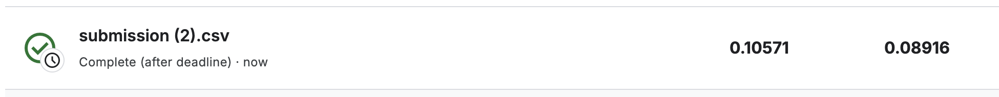

#Можем видеть что на тренировочной и валидационной выборках мы видимо хорошую точность у модели, однако на тестовых данных точность очень плохая 

#Проведем eda доя тестовых данных

In [90]:
import os

test_dir = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test"

manip_count = 0
unalt_count = 0
total_files = 0

for fname in os.listdir(test_dir):
    if fname.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp")):
        total_files += 1
        if "manip" in fname.lower():
            manip_count += 1
        elif "unalt" in fname.lower():
            unalt_count += 1

print("Всего файлов в тесте:", total_files)
print("manip:", manip_count)
print("unalt:", unalt_count)
print("Пропорция manip:", manip_count / total_files if total_files > 0 else 0)
print("Пропорция unalt:", unalt_count / total_files if total_files > 0 else 0)


Всего файлов в тесте: 2640
manip: 1320
unalt: 1320
Пропорция manip: 0.5
Пропорция unalt: 0.5


In [91]:
import os
from PIL import Image
import numpy as np

widths = []
heights = []
for fname in os.listdir(test_dir):
    if fname.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp")):
        path = os.path.join(test_dir, fname)
        with Image.open(path) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)

if widths and heights:
    print("Средняя ширина:", np.mean(widths), "±", np.std(widths))
    print("Средняя высота:", np.mean(heights), "±", np.std(heights))

    print("Минимальная ширина:", min(widths), "Максимальная ширина:", max(widths))
    print("Минимальная высота:", min(heights), "Максимальная высота:", max(heights))


Средняя ширина: 512.0 ± 0.0
Средняя высота: 512.0 ± 0.0
Минимальная ширина: 512 Максимальная ширина: 512
Минимальная высота: 512 Максимальная высота: 512


In [92]:
import numpy as np

def compute_brightness(img):
    # Перевод в оттенки серого и вычисление средней яркости
    gray = np.array(img.convert('L'))
    return gray.mean()

brightness_vals = []
for fname in os.listdir(test_dir):
    if fname.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp")):
        path = os.path.join(test_dir, fname)
        with Image.open(path) as img:
            brightness_vals.append(compute_brightness(img))

if brightness_vals:
    print("Средняя яркость:", np.mean(brightness_vals), "±", np.std(brightness_vals))


Средняя яркость: 105.18767835877158 ± 39.125236776076434


In [93]:
import exifread

sample_file = os.path.join(test_dir, os.listdir(test_dir)[0])
with open(sample_file, 'rb') as f:
    tags = exifread.process_file(f)
print("EXIF:", tags)


PNG file does not have exif data.


EXIF: {}


In [95]:
import os
import numpy as np
from PIL import Image

def compute_brightness(img):
    # Перевод в оттенки серого и вычисление средней яркости
    arr = np.array(img.convert('L'))
    return arr.mean()

train_dir = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"

manip_count = 0
unalt_count = 0
total_files = 0

widths = []
heights = []
brightness_vals = []

# Проходим по каждой поддиректории (камера) внутри train_dir
for camera_dir in os.listdir(train_dir):
    camera_path = os.path.join(train_dir, camera_dir)
    if not os.path.isdir(camera_path):
        continue  # пропускаем, если не папка

    # Внутри каждой папки лежат изображения
    for fname in os.listdir(camera_path):
        if fname.lower().endswith((".jpg", ".jpeg", ".png", ".tif", ".bmp")):
            total_files += 1

            # Проверяем, есть ли 'manip' или 'unalt' в имени файла
            if "manip" in fname.lower():
                manip_count += 1
            elif "unalt" in fname.lower():
                unalt_count += 1

            # Открываем изображение, собираем информацию о размере и яркости
            file_path = os.path.join(camera_path, fname)
            with Image.open(file_path) as img:
                w, h = img.size
                widths.append(w)
                heights.append(h)
                brightness_vals.append(compute_brightness(img))

print("=== Train Dataset EDA ===")
print(f"Всего файлов: {total_files}")
print(f"manip: {manip_count} ({manip_count/total_files*100:.2f}%)")
print(f"unalt: {unalt_count} ({unalt_count/total_files*100:.2f}%)")

if widths and heights:
    print(f"Средняя ширина: {np.mean(widths):.2f} ± {np.std(widths):.2f}")
    print(f"Средняя высота: {np.mean(heights):.2f} ± {np.std(heights):.2f}")

if brightness_vals:
    print(f"Средняя яркость: {np.mean(brightness_vals):.2f} ± {np.std(brightness_vals):.2f}")

=== Train Dataset EDA ===
Всего файлов: 2750
manip: 0 (0.00%)
unalt: 0 (0.00%)
Средняя ширина: 3708.76 ± 1097.68
Средняя высота: 2978.95 ± 728.06
Средняя яркость: 112.51 ± 21.45


In [96]:
import torchvision.transforms as transforms

transform_train_new = transforms.Compose([
    # Сначала выбираем случайный кусок 512x512 из высокого разрешения
    transforms.RandomCrop(512),
    # Затем масштабируем выбранный кусок до размера, который требуется модели (например, 224x224)
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_test_new = transforms.Compose([
    transforms.Resize(512),
    transforms.CenterCrop(512),  # поскольку тестовые данные уже 512x512, можно даже пропустить этот шаг, если гарантированно все файлы 512x512
    transforms.Resize((224, 224)),  # если модель ожидает 224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [97]:
train_dir = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"
full_train_dataset_new = ImageFolder(root=train_dir, transform=transform_train_new)
class_names = full_train_dataset_new.classes

In [98]:
train_size = int(0.8 * len(full_train_dataset))
val_size = len(full_train_dataset) - train_size
train_dataset_new, val_dataset_new = random_split(full_train_dataset_new, [train_size, val_size])

In [99]:
val_dataset_new.dataset.transform = transform_test_new

In [100]:
train_loader_new = DataLoader(train_dataset_new, batch_size=32, shuffle=True, num_workers=0)
val_loader_new = DataLoader(val_dataset_new, batch_size=32, shuffle=False, num_workers=0)


In [101]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

Используем устройство: mps


In [102]:
efficientnet_b0_new = timm.create_model('efficientnet_b0', pretrained=True)
num_features = efficientnet_b0_new.classifier.in_features
efficientnet_b0_new.classifier = nn.Linear(num_features, len(class_names))
efficientnet_b0_new = efficientnet_b0_new.to(device)

In [103]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(efficientnet_b0_new.parameters(), lr=1e-4)

In [105]:
pd.Series(train_dataset_new.dataset.targets).value_counts()

0    275
1    275
2    275
3    275
4    275
5    275
6    275
7    275
8    275
9    275
Name: count, dtype: int64

In [106]:
num_epochs = 11  # количество эпох (можно увеличить для лучшей сходимости)

for epoch in range(num_epochs):
    efficientnet_b0_new.train()
    running_loss = 0.0
    total_train = 0
    correct_train = 0

    for images, labels in train_loader_new:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = efficientnet_b0_new(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        total_train += labels.size(0)
        correct_train += (preds == labels).sum().item()

    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    efficientnet_b0_new.eval()
    running_val_loss = 0.0
    total_val = 0
    correct_val = 0
    with torch.no_grad():
        for images, labels in val_loader_new:
            images = images.to(device)
            labels = labels.to(device)
            outputs = efficientnet_b0_new(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            total_val += labels.size(0)
            correct_val += (preds == labels).sum().item()

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Сохраняем обученную модель
torch.save(efficientnet_b0_new.state_dict(), "efficientnet_b0_new.pth")
print("Модель сохранена как efficientnet_b0_new.pth")

Epoch 1/11: Train Loss: 2.0238, Train Acc: 0.3700, Val Loss: 1.6826, Val Acc: 0.4855
Epoch 2/11: Train Loss: 1.3232, Train Acc: 0.6514, Val Loss: 1.1844, Val Acc: 0.6436
Epoch 3/11: Train Loss: 0.7538, Train Acc: 0.8164, Val Loss: 0.8244, Val Acc: 0.7455
Epoch 4/11: Train Loss: 0.3811, Train Acc: 0.9105, Val Loss: 0.6582, Val Acc: 0.7891
Epoch 5/11: Train Loss: 0.1895, Train Acc: 0.9677, Val Loss: 0.6074, Val Acc: 0.7945
Epoch 6/11: Train Loss: 0.0810, Train Acc: 0.9923, Val Loss: 0.5946, Val Acc: 0.7964
Epoch 7/11: Train Loss: 0.0419, Train Acc: 0.9982, Val Loss: 0.5877, Val Acc: 0.7982
Epoch 8/11: Train Loss: 0.0312, Train Acc: 0.9968, Val Loss: 0.5944, Val Acc: 0.7945
Epoch 9/11: Train Loss: 0.0246, Train Acc: 0.9991, Val Loss: 0.6129, Val Acc: 0.8018
Epoch 10/11: Train Loss: 0.0148, Train Acc: 0.9995, Val Loss: 0.6058, Val Acc: 0.8055
Epoch 11/11: Train Loss: 0.0122, Train Acc: 0.9991, Val Loss: 0.6162, Val Acc: 0.8073
Модель сохранена как efficientnet_b0_new.pth


In [107]:

# Переводим модель в режим оценки
efficientnet_b0_new.load_state_dict(torch.load("efficientnet_b0_new.pth"))
efficientnet_b0_new.eval()

# Создаем тестовый датасет с использованием CustomTestDataset.
# Убедитесь, что пути указаны верно:
test_dataset_new = CustomTestDataset(
    csv_file="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/sample_submission.csv",  # CSV со списком имен файлов
    root_dir="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test",            # Папка с тестовыми изображениями
    transform=transform_test_new  # Используем стабильный transform для теста (Resize+CenterCrop, ToTensor, Normalize)
)
#"/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification

# Создаем DataLoader для тестового набора
test_loader_new = DataLoader(dataset=test_dataset_new, batch_size=32, shuffle=False, num_workers=0)

# Функция инференса для тестового набора
def test_inference(model, test_loader, class_names):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images, file_names in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            # Преобразуем предсказания в названия классов
            predicted_classes = [class_names[idx] for idx in predicted.cpu().numpy()]
            predictions.extend(zip(file_names, predicted_classes))
    return predictions

# Получаем предсказания
test_predictions = test_inference(efficientnet_b0_new, test_loader_new, class_names)

# Формируем DataFrame для сабмита: два столбца "fname" и "camera"
submission_df = pd.DataFrame(test_predictions, columns=["fname", "camera"])
submission_df.to_csv("submission_new.csv", index=False)
print("Submission file saved as submission_new.csv")

Submission file saved as submission_new.csv


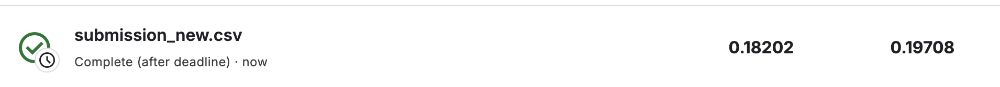

Результат лучше, но все еще плохой 

Попробуем создать модель где каждая фотография в тренировочном наборе даёт несколько случайных вырезок (512×512)

In [123]:
import random
import torchvision.transforms.functional as F
from torch.utils.data import Dataset

class DistinctMultiCropDataset(Dataset):
    """
    Для каждого изображения генерирует несколько (num_crops) случайных вырезок,
    используя разные seed, чтобы они были действительно разными.
    """
    def __init__(self, base_dataset, num_crops=3, crop_size=512, transform=None):
        self.base_dataset = base_dataset
        self.num_crops = num_crops
        self.crop_size = crop_size
        self.transform = transform

    def __len__(self):
        return len(self.base_dataset) * self.num_crops

    def __getitem__(self, idx):
        image_idx = idx // self.num_crops
        crop_idx = idx % self.num_crops
        
        image, label = self.base_dataset[image_idx]  # PIL image
        w, h = image.size
        
        # Устанавливаем seed на основе (image_idx, crop_idx), чтобы каждый crop_idx давал разные координаты
        # но при этом повторяемость при вызове __getitem__ одинаковая
        random.seed(image_idx * 1000 + crop_idx)
        
        # Случайный left, top
        max_left = max(0, w - self.crop_size)
        max_top = max(0, h - self.crop_size)
        left = random.randint(0, max_left)
        top = random.randint(0, max_top)
        
        # Вырезаем фрагмент
        cropped_img = F.crop(image, top, left, self.crop_size, self.crop_size)
        
        # Применяем transform
        if self.transform is not None:
            cropped_img = self.transform(cropped_img)
        
        return cropped_img, label


In [124]:
transform_train_distinct = transforms.Compose([
    # Здесь мы предполагаем, что уже вырезали crop_size=512,
    # теперь масштабируем до 224, и т.д.
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

transform_val_distinct = transforms.Compose([
    transforms.Resize(512),
    transforms.CenterCrop(512),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

In [125]:
train_dir_multicrop = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"
base_dataset_distinct = ImageFolder(root=train_dir_multicrop, transform=None)  # transform=None

In [126]:
multi_crop_distinct_dataset = DistinctMultiCropDataset(
    base_dataset=base_dataset_distinct,
    num_crops=3,
    crop_size=512,
    transform=transform_train_distinct
)

In [127]:
train_size = int(0.8 * len(multi_crop_distinct_dataset))
val_size = len(multi_crop_distinct_dataset) - train_size
train_dataset_distinct, val_dataset_distinct = random_split(multi_crop_distinct_dataset, [train_size, val_size])

In [128]:
val_dataset_distinct.dataset.transform = transform_val_distinct

In [129]:
train_loader_distinct = DataLoader(train_dataset_distinct, batch_size=32, shuffle=True)
val_loader_distinct = DataLoader(val_dataset_distinct, batch_size=32, shuffle=False)

In [130]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

model_distinct = timm.create_model('efficientnet_b0', pretrained=True)
num_features = model_distinct.classifier.in_features
model_distinct.classifier = nn.Linear(num_features, len(base_dataset_distinct.classes))
model_distinct = model_distinct.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_distinct.parameters(), lr=1e-4)

num_epochs_multicrop = 12  # Можно увеличить для лучшей сходимости

Используем устройство: mps


In [132]:
# Предположим, вы уже создали base_train_dataset_multicrop и multi_crop_train_dataset, как в примере выше:

print("Длина исходного датасета (ImageFolder):", len(base_dataset_distinct))
print("Длина мульти-кроп датасета:", len(train_dataset_distinct))

Длина исходного датасета (ImageFolder): 2750
Длина мульти-кроп датасета: 6600


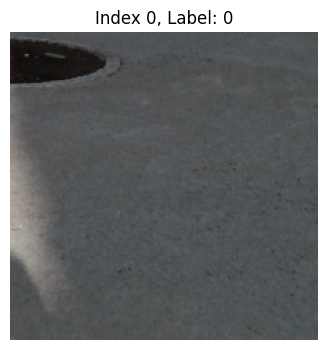

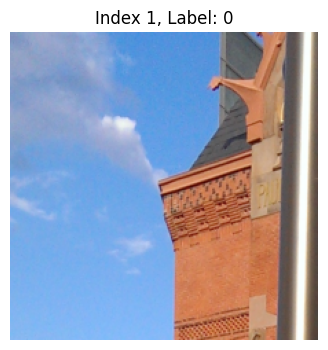

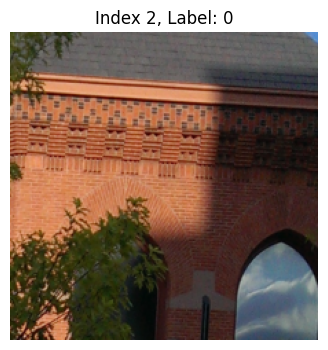

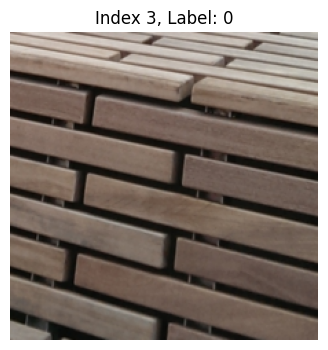

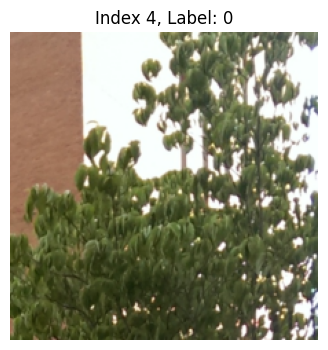

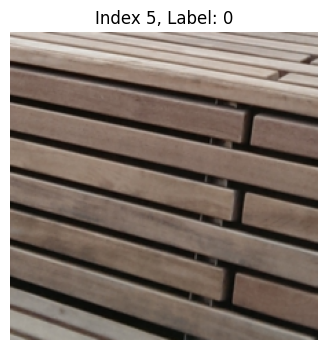

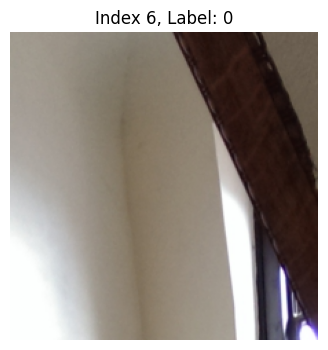

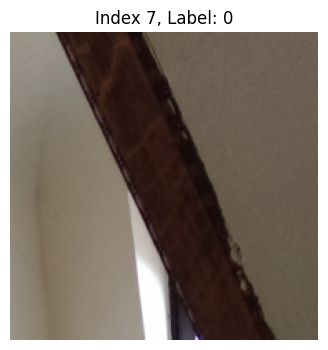

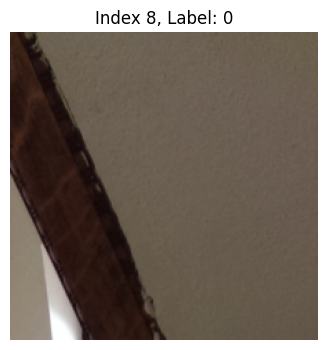

In [137]:
import matplotlib.pyplot as plt
import torch

# Средства для "разнормализации" (чтобы изображение выглядело естественно при отображении)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def unnormalize(tensor_img, mean, std):
    """
    Снимает нормализацию, чтобы можно было корректно отобразить изображение.
    tensor_img: тензор [C, H, W]
    mean, std: списки, соответствующие mean/std для каждого канала.
    Возвращает тензор, значения которого лежат в диапазоне [0, 1].
    """
    result = tensor_img.clone()
    for t, m, s in zip(result, mean, std):
        t.mul_(s).add_(m)
    return result.clamp_(0, 1)

def show_multi_crop_samples(dataset, num_samples=6):
    """
    Показывает несколько изображений из датасета, созданного с помощью мульти-кропа.
    dataset: датасет (например, train_dataset_distinct)
    num_samples: сколько изображений показать
    """
    for i in range(num_samples):
        img_tensor, label = dataset[i]
        # Снимаем нормализацию
        img_unnorm = unnormalize(img_tensor, mean, std)
        # Переводим изображение из [C, H, W] в [H, W, C] для отображения
        img_np = img_unnorm.permute(1, 2, 0).cpu().numpy()
        
        plt.figure(figsize=(4, 4))
        plt.imshow(img_np)
        plt.title(f"Index {i}, Label: {label}")
        plt.axis("off")
        plt.show()

# Пример использования:
# Замените train_dataset_distinct на имя вашего обучающего датасета, созданного с мульти-кропингом.
show_multi_crop_samples(multi_crop_distinct_dataset, num_samples=9)


Можем увидить что при таком подходе некоторые изображения задублировались

In [9]:

class DistinctMultiCropDataset_1(Dataset):
    def __init__(self, base_dataset, num_crops=3, crop_size=512, transform=None):
        self.base_dataset = base_dataset
        self.num_crops = num_crops
        self.crop_size = crop_size
        self.transform = transform

    def __len__(self):
        return len(self.base_dataset) * self.num_crops

    def __getitem__(self, idx):
        base_idx = idx // self.num_crops  # Индекс исходного изображения
        crop_idx = idx % self.num_crops   # Индекс обрезки

        img, label = self.base_dataset[base_idx]

        # Случайное положение для crop
        width, height = img.size
        x_max = max(width - self.crop_size, 1)
        y_max = max(height - self.crop_size, 1)

        # Генерируем уникальные координаты для каждой обрезки
        random.seed(base_idx * 1000 + crop_idx)  # Уникальный seed для стабильности
        x = random.randint(0, x_max)
        y = random.randint(0, y_max)

        img = img.crop((x, y, x + self.crop_size, y + self.crop_size))

        if self.transform:
            img = self.transform(img)

        return img, label

In [11]:
transform_train_distinct_1 = transforms.Compose([
    transforms.Resize((224, 224)),  # Сначала уменьшаем размер кропа
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

transform_val_distinct_1 = transforms.Compose([
    transforms.Resize(512),
    transforms.CenterCrop(512),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])


In [12]:
train_dir_multicrop_1 = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"
base_dataset_distinct_1 = ImageFolder(root=train_dir_multicrop_1, transform=None)  # transform=None

In [13]:
multi_crop_distinct_dataset_1 = DistinctMultiCropDataset_1(
    base_dataset=base_dataset_distinct_1,
    num_crops=2,
    crop_size=512,
    transform=transform_train_distinct_1
)

In [14]:
print("Длина исходного датасета (ImageFolder):", len(base_dataset_distinct_1))
print("Длина мульти-кроп датасета:", len(multi_crop_distinct_dataset_1))

Длина исходного датасета (ImageFolder): 2750
Длина мульти-кроп датасета: 5500


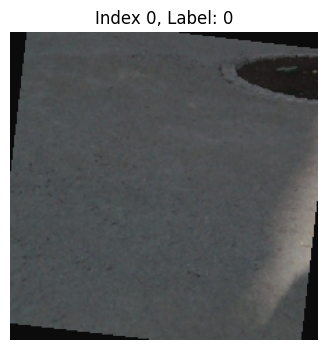

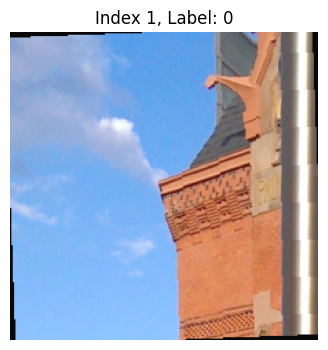

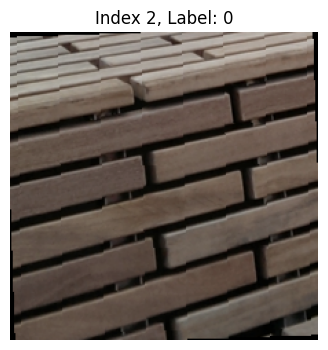

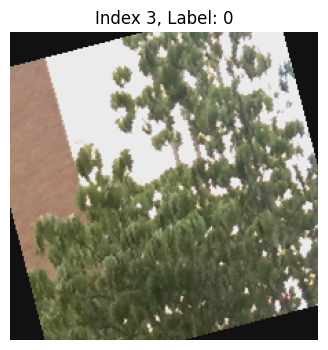

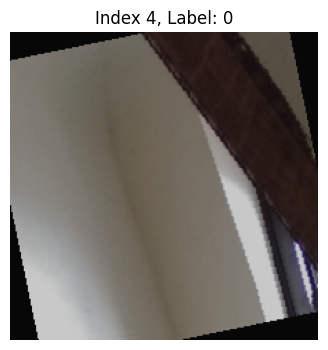

...

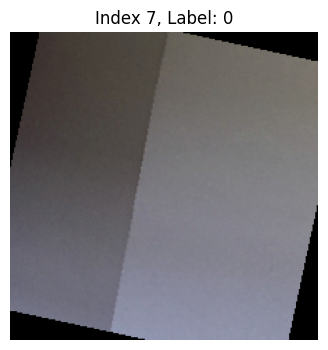

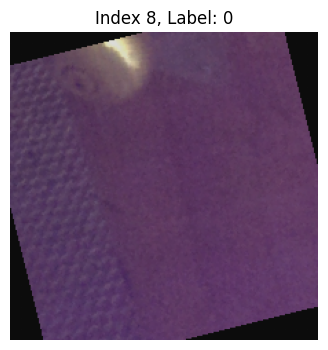

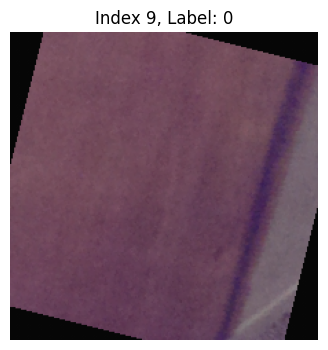

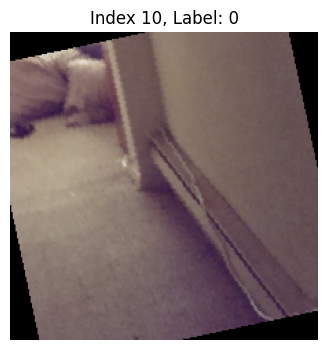

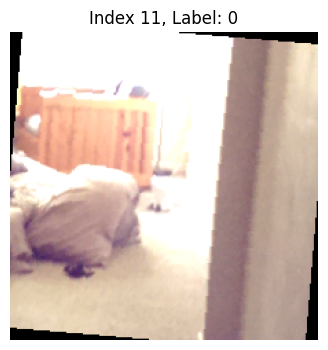

In [164]:
import matplotlib.pyplot as plt

def show_multi_crop_samples(dataset, num_samples=6):
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    def unnormalize(tensor_img, mean, std):
        result = tensor_img.clone()
        for t, m, s in zip(result, mean, std):
            t.mul_(s).add_(m)
        return result.clamp_(0, 1)

    for i in range(num_samples):
        img_tensor, label = dataset[i]
        img_unnorm = unnormalize(img_tensor, mean, std)
        img_np = img_unnorm.permute(1, 2, 0).cpu().numpy()

        plt.figure(figsize=(4, 4))
        plt.imshow(img_np)
        plt.title(f"Index {i}, Label: {label}")
        plt.axis("off")
        plt.show()

show_multi_crop_samples(multi_crop_distinct_dataset_1, num_samples=12)


In [15]:
train_size = int(0.8 * len(multi_crop_distinct_dataset_1))
val_size = len(multi_crop_distinct_dataset_1) - train_size
train_dataset_distinct_1, val_dataset_distinct_1 = random_split(multi_crop_distinct_dataset_1, [train_size, val_size])

In [16]:

val_dataset_distinct_1.dataset.transform = transform_val_distinct_1

In [17]:
train_loader_distinct_1 = DataLoader(train_dataset_distinct_1, batch_size=32, shuffle=True)
val_loader_distinct_1 = DataLoader(val_dataset_distinct_1, batch_size=32, shuffle=False)

In [169]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

model_distinct_1 = timm.create_model('efficientnet_b0', pretrained=True)
num_features = model_distinct_1.classifier.in_features
model_distinct_1.classifier = nn.Linear(num_features, len(base_dataset_distinct_1.classes))
model_distinct_1 = model_distinct_1.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_distinct_1.parameters(), lr=1e-4)

num_epochs_multicrop = 12  # Можно увеличить для лучшей сходимости

Используем устройство: mps


In [18]:
print("Длина исходного датасета (ImageFolder):", len(base_dataset_distinct_1))
print("Длина мульти-кроп датасета:", len(multi_crop_distinct_dataset_1))
print("Длина мульти-кроп test датасета:", len(train_dataset_distinct_1))

Длина исходного датасета (ImageFolder): 2750
Длина мульти-кроп датасета: 5500
Длина мульти-кроп test датасета: 4400


In [171]:
for epoch in range(num_epochs_multicrop):
    model_distinct_1.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader_distinct_1:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_distinct_1(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)
    
    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    model_distinct_1.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        for images, labels in val_loader_distinct_1:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model_distinct_1(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_val += (preds == labels).sum().item()
            total_val += labels.size(0)

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

torch.save(model_distinct_1.state_dict(), "efficientnet_b0_distinct_1.pth")
print("Модель сохранена как efficientnet_b0_distinct_1.pth")

Epoch 1/11: Train Loss: 2.0019, Train Acc: 0.3352, Val Loss: 1.5215, Val Acc: 0.5364
Epoch 2/11: Train Loss: 1.0923, Train Acc: 0.6727, Val Loss: 0.8316, Val Acc: 0.7291
Epoch 3/11: Train Loss: 0.5978, Train Acc: 0.8216, Val Loss: 0.5980, Val Acc: 0.8155
Epoch 4/11: Train Loss: 0.3525, Train Acc: 0.8986, Val Loss: 0.5031, Val Acc: 0.8273
Epoch 5/11: Train Loss: 0.2324, Train Acc: 0.9332, Val Loss: 0.4840, Val Acc: 0.8318
Epoch 6/11: Train Loss: 0.1497, Train Acc: 0.9577, Val Loss: 0.4693, Val Acc: 0.8464
Epoch 7/11: Train Loss: 0.1026, Train Acc: 0.9723, Val Loss: 0.4511, Val Acc: 0.8582
Epoch 8/11: Train Loss: 0.0896, Train Acc: 0.9766, Val Loss: 0.4455, Val Acc: 0.8491
Epoch 9/11: Train Loss: 0.0873, Train Acc: 0.9759, Val Loss: 0.4818, Val Acc: 0.8500
Epoch 10/11: Train Loss: 0.0639, Train Acc: 0.9834, Val Loss: 0.4610, Val Acc: 0.8473
Epoch 11/11: Train Loss: 0.0553, Train Acc: 0.9841, Val Loss: 0.4409, Val Acc: 0.8618
Epoch 12/11: Train Loss: 0.0595, Train Acc: 0.9834, Val Loss: 0

In [173]:
class_names = base_dataset_distinct_1.classes

In [175]:
# Переводим модель в режим оценки
model_distinct_1.load_state_dict(torch.load("efficientnet_b0_distinct_1.pth"))
model_distinct_1.eval()

# Создаем тестовый датасет с использованием CustomTestDataset.
# Убедитесь, что пути указаны верно:
test_dataset_distinct_1 = CustomTestDataset(
    csv_file="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/sample_submission.csv",  # CSV со списком имен файлов
    root_dir="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test",            # Папка с тестовыми изображениями
    transform=transform_val_distinct_1  # Используем стабильный transform для теста (Resize+CenterCrop, ToTensor, Normalize)
)
#"/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification

# Создаем DataLoader для тестового набора
test_loader_distinct_1  = DataLoader(dataset=test_dataset_distinct_1, batch_size=32, shuffle=False, num_workers=0)


# Функция инференса для тестового набора
def test_inference(model, test_loader, class_names):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images, file_names in test_loader:
            images = images.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            # Преобразуем предсказания в названия классов
            predicted_classes = [class_names[idx] for idx in predicted.cpu().numpy()]
            predictions.extend(zip(file_names, predicted_classes))
    return predictions

# Получаем предсказания
test_predictions = test_inference(model_distinct_1, test_loader_distinct_1, class_names)

# Формируем DataFrame для сабмита: два столбца "fname" и "camera"
submission_df = pd.DataFrame(test_predictions, columns=["fname", "camera"])
submission_df.to_csv("submission_distinct_1.csv", index=False)
print("Submission file saved as submission_distinct_1.csv")

Submission file saved as submission_distinct_1.csv


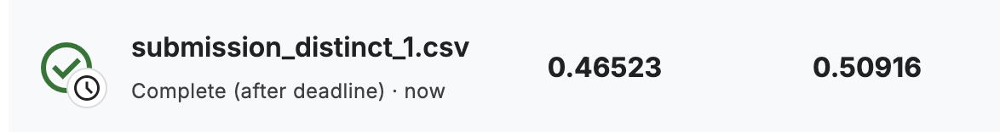

Попробуем применить TTA трансформации

In [5]:
import torchvision.transforms.functional as TF

# Базовая трансформация (Resize, CenterCrop, ToTensor, Normalize)
transform_val_distinct_1 = transforms.Compose([
    transforms.Resize(512),
    transforms.CenterCrop(512),
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Функция, которая превращает PIL-изображение в тензор через transform_test_base
def base_transform(pil_img):
    """Исходное изображение без дополнительных аугментаций."""
    return transform_val_distinct_1(pil_img)

def hflip_transform(pil_img):
    """Горизонтальное отражение."""
    pil_img = TF.hflip(pil_img)
    return transform_val_distinct_1(pil_img)

def rotate5_transform(pil_img):
    """Поворот на +5 градусов."""
    pil_img = TF.rotate(pil_img, angle=5)
    return transform_val_distinct_1(pil_img)

def rotate_neg5_transform(pil_img):
    """Поворот на -5 градусов."""
    pil_img = TF.rotate(pil_img, angle=-5)
    return transform_val_distinct_1(pil_img)

def vflip_transform(pil_img):
    """Вертикальное отражение."""
    pil_img = TF.vflip(pil_img)
    return transform_val_distinct_1(pil_img)

# Список TTA-трансформаций
tta_transforms = [
    base_transform,
    hflip_transform,
    rotate5_transform,
    rotate_neg5_transform,
    vflip_transform
]


In [6]:
# Функция TTA-инференса для одного изображения
def tta_inference_single_image(model, pil_img, tta_transforms, device, class_names):
    model.eval()
    sum_logits = None
    with torch.no_grad():
        for tta_fn in tta_transforms:
            tta_tensor = tta_fn(pil_img).unsqueeze(0).to(device)  # [1, C, H, W]
            outputs = model(tta_tensor)  # логиты
            if sum_logits is None:
                sum_logits = outputs
            else:
                sum_logits += outputs
    # Усредняем логиты и выбираем класс с максимальной вероятностью
    avg_logits = sum_logits / len(tta_transforms)
    _, predicted_idx = torch.max(avg_logits, dim=1)
    return class_names[predicted_idx.item()]

In [185]:
def test_inference_tta(model, test_dataset, device, class_names, tta_transforms):
    model.eval()
    predictions = []
    for i in range(len(test_dataset)):
        pil_img, fname = test_dataset[i]
        pred_class = tta_inference_single_image(model, pil_img, tta_transforms, device, class_names)
        predictions.append((fname, pred_class))
    return predictions

In [186]:
model_distinct_1.load_state_dict(torch.load("efficientnet_b0_distinct_1.pth", map_location=device))
model_distinct_1.eval()

test_dataset_tta = CustomTestDataset(
    csv_file="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/sample_submission.csv",
    root_dir="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test",
    transform=None
)

# Выполняем TTA-инференс (используем, например, model_distinct_1, если это ваша улучшенная модель)
#tta_predictions = test_inference_tta(model_distinct_1, test_dataset_tta, device, class_names, tta_transforms)
tta_predictions = test_inference_tta(
    model_distinct_1,
    test_dataset_tta,
    device,
    class_names,
    tta_transforms
)

# Формируем DataFrame для сабмита в требуемом формате
submission_df = pd.DataFrame(tta_predictions, columns=["fname", "camera"])
submission_df.to_csv("submission_distinct_1tta.csv", index=False)
print("Submission saved as submission_distinct_1tta.csv")

Submission saved as submission_distinct_1tta.csv


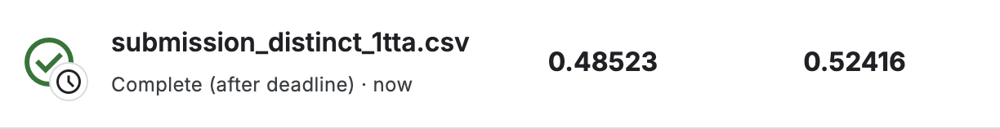

#Попробуем сосредоточиться на том что половина тестовой выборки это manip изображения

In [7]:
class PseudoManipMultiCropDataset(Dataset):
    """
    Генерирует 3 фрагмента (crop) на каждое исходное изображение:
    - crop_idx 0 и 1 => обычная трансформация (normal_transform)
    - crop_idx 2 => манипулирующая трансформация (manip_transform)
    Итого 2/3 обычных, 1/3 псевдо-manip.
    """
    def __init__(self, base_dataset, crop_size=512,
                 normal_transform=None, manip_transform=None):
        """
        base_dataset: датасет, возвращающий (PIL-изображение, label).
        crop_size: размер вырезаемого фрагмента (512).
        normal_transform: трансформация для обычных фрагментов.
        manip_transform: трансформация для манипулируемых фрагментов.
        """
        self.base_dataset = base_dataset
        self.crop_size = crop_size
        self.normal_transform = normal_transform
        self.manip_transform = manip_transform
        # Мы жёстко зашиваем num_crops = 3
        self.num_crops = 3

    def __len__(self):
        # 3 фрагмента на каждое изображение
        return len(self.base_dataset) * self.num_crops

    def __getitem__(self, idx):
        # base_idx - индекс исходного изображения
        # crop_idx - какой по счёту фрагмент (0..2)
        base_idx = idx // self.num_crops
        crop_idx = idx % self.num_crops

        pil_img, label = self.base_dataset[base_idx]  # PIL-изображение

        # Случайно обрезаем (crop_size×crop_size)
        w, h = pil_img.size
        x_max = max(w - self.crop_size, 0)
        y_max = max(h - self.crop_size, 0)

        # Уникальный seed, чтобы при каждом вызове индекс давал один и тот же crop
        random.seed(base_idx * 1000 + crop_idx)
        x = random.randint(0, x_max) if x_max > 0 else 0
        y = random.randint(0, y_max) if y_max > 0 else 0

        # Вырезаем фрагмент
        pil_crop = pil_img.crop((x, y, x + self.crop_size, y + self.crop_size))

        # Если crop_idx < 2 => normal_transform, иначе manip_transform
        if crop_idx < 2:
            # Обычный фрагмент
            if self.normal_transform:
                pil_crop = self.normal_transform(pil_crop)
        else:
            # Псевдо-manip фрагмент
            if self.manip_transform:
                pil_crop = self.manip_transform(pil_crop)

        return pil_crop, label

In [8]:
import torchvision.transforms as T
from torchvision.transforms import RandomApply, ColorJitter, RandomPosterize

# Обычная трансформация (без агрессивных фильтров)
normal_transform = T.Compose([
    T.Resize((224, 224)),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(15),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])

# Манипулирующая трансформация (имитируем фильтры)
manip_transform = T.Compose([
    # Можно добавить здесь более агрессивные цветовые преобразования
    RandomApply([
        ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
        RandomPosterize(bits=4)
    ], p=1.0),  # Применяем 100% к третьему фрагменту
    # Дальше те же шаги (flip/rotate?), если хотите
    T.RandomHorizontalFlip(p=0.5),
    T.RandomRotation(15),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])
val_transform = T.Compose([
    T.Resize(512),
    T.CenterCrop(512),
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406],
                [0.229, 0.224, 0.225])
])


In [9]:
train_dir = "/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/train/train"
base_dataset = ImageFolder(root=train_dir, transform=None)

pseudo_multicrop_dataset = PseudoManipMultiCropDataset(
    base_dataset=base_dataset,
    crop_size=512,
    normal_transform=normal_transform,
    manip_transform=manip_transform
)

print("Оригинальное количество изображений:", len(base_dataset))
print("Итоговое количество фрагментов:", len(pseudo_multicrop_dataset))

Оригинальное количество изображений: 2750
Итоговое количество фрагментов: 8250


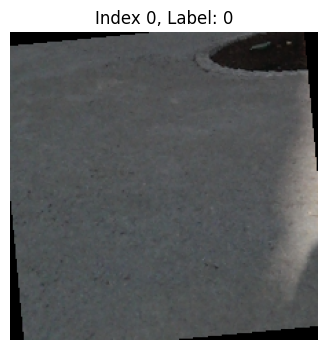

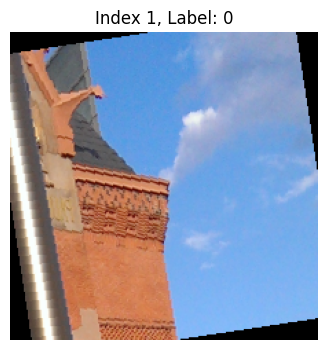

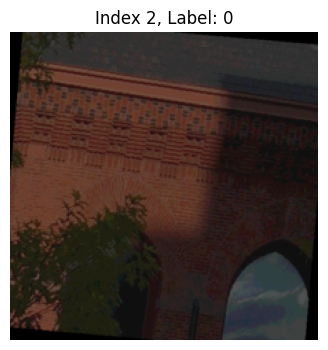

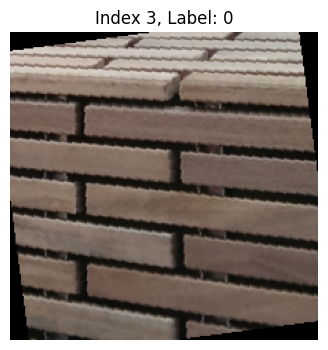

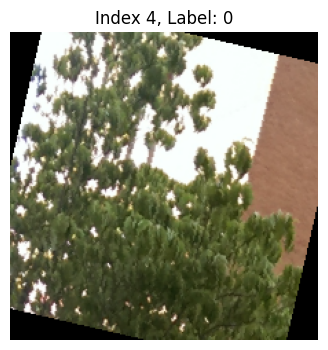

...

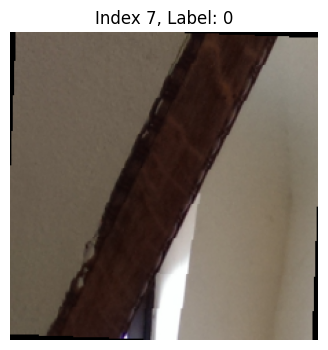

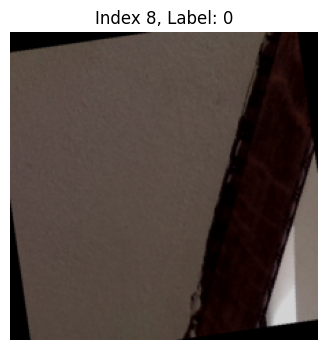

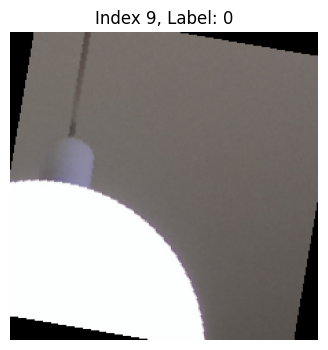

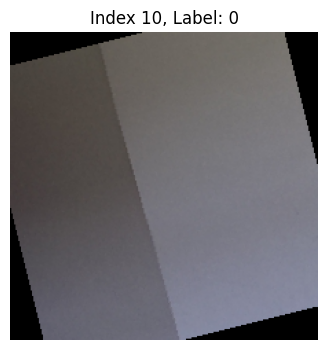

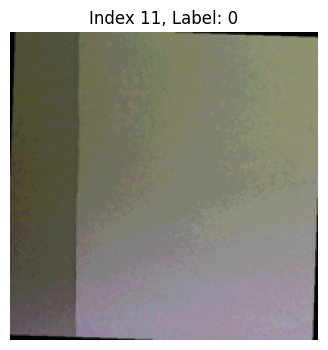

In [14]:
import matplotlib.pyplot as plt
import torch
import random

# Средства для "разнормализации" (чтобы изображение выглядело естественно при отображении)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def unnormalize(tensor_img, mean, std):
    """
    Снимает нормализацию, чтобы можно было корректно отобразить изображение.
    tensor_img: тензор [C, H, W]
    mean, std: списки, соответствующие mean/std для каждого канала.
    Возвращает тензор, значения которого лежат в диапазоне [0, 1].
    """
    result = tensor_img.clone()
    for t, m, s in zip(result, mean, std):
        t.mul_(s).add_(m)
    return result.clamp_(0, 1)

def show_multi_crop_samples(dataset, num_samples=6):
    """
    Показывает несколько изображений из датасета, созданного с помощью мульти-кропа.
    dataset: датасет (например, train_dataset_distinct)
    num_samples: сколько изображений показать
    """
    for i in range(num_samples):
        img_tensor, label = dataset[i]
        # Снимаем нормализацию
        img_unnorm = unnormalize(img_tensor, mean, std)
        # Переводим изображение из [C, H, W] в [H, W, C] для отображения
        img_np = img_unnorm.permute(1, 2, 0).cpu().numpy()
        
        plt.figure(figsize=(4, 4))
        plt.imshow(img_np)
        plt.title(f"Index {i}, Label: {label}")
        plt.axis("off")
        plt.show()
        
show_multi_crop_samples(pseudo_multicrop_dataset, num_samples=12)

In [15]:
train_size = int(0.8 * len(pseudo_multicrop_dataset))
val_size = len(pseudo_multicrop_dataset) - train_size
train_dataset, val_dataset = random_split(pseudo_multicrop_dataset, [train_size, val_size])

In [ ]:
torch.save(train_dataset, 'train_dataset.pth')
torch.save(val_dataset, 'val_dataset.pth') 
torch.save(base_dataset.classes, 'classes.pth')

In [16]:
val_dataset.dataset.normal_transform = val_transform
val_dataset.dataset.manip_transform = val_transform

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0)

In [199]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

efficientnet_b0_pseudo_manip = timm.create_model('efficientnet_b0', pretrained=True)
num_features = efficientnet_b0_pseudo_manip.classifier.in_features
efficientnet_b0_pseudo_manip.classifier = nn.Linear(num_features, len(base_dataset.classes))
efficientnet_b0_pseudo_manip = efficientnet_b0_pseudo_manip.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(efficientnet_b0_pseudo_manip.parameters(), lr=1e-4)
num_epochs = 6

Используем устройство: mps


In [200]:
for epoch in range(num_epochs):
    efficientnet_b0_pseudo_manip.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = efficientnet_b0_pseudo_manip(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)
    
    train_loss = running_loss / total_train
    train_acc = correct_train / total_train

    # Валидация
    efficientnet_b0_pseudo_manip.eval()
    running_val_loss = 0.0
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = efficientnet_b0_pseudo_manip(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item() * images.size(0)
            _, preds = torch.max(outputs, 1)
            correct_val += (preds == labels).sum().item()
            total_val += labels.size(0)

    val_loss = running_val_loss / total_val
    val_acc = correct_val / total_val

    print(f"Epoch {epoch+1}/{num_epochs}: "
          f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# Сохраняем модель
torch.save(efficientnet_b0_pseudo_manip.state_dict(), "efficientnet_b0_pseudo_manip.pth")
print("Модель сохранена как efficientnet_b0_pseudo_manip.pth")

Epoch 1/6: Train Loss: 1.7925, Train Acc: 0.4173, Val Loss: 1.0951, Val Acc: 0.6673
Epoch 2/6: Train Loss: 0.8172, Train Acc: 0.7388, Val Loss: 0.6064, Val Acc: 0.7903
Epoch 3/6: Train Loss: 0.4515, Train Acc: 0.8582, Val Loss: 0.4372, Val Acc: 0.8564
Epoch 4/6: Train Loss: 0.2480, Train Acc: 0.9283, Val Loss: 0.3750, Val Acc: 0.8764
Epoch 5/6: Train Loss: 0.1658, Train Acc: 0.9520, Val Loss: 0.3736, Val Acc: 0.8812
Epoch 6/6: Train Loss: 0.1219, Train Acc: 0.9627, Val Loss: 0.3436, Val Acc: 0.8927
Модель сохранена как efficientnet_b0_pseudo_manip.pth


In [201]:
efficientnet_b0_pseudo_manip.load_state_dict(torch.load("efficientnet_b0_pseudo_manip.pth", map_location=device))
efficientnet_b0_pseudo_manip.eval()

test_dataset_manip_tta = CustomTestDataset(
    csv_file="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/sample_submission.csv",
    root_dir="/Users/natalia/Documents/Учеба/Deep_Learning/Проект/sp-society-camera-model-identification/test/test",
    transform=None
)

# Выполняем TTA-инференс (используем, например, efficientnet_b0_pseudo_manip, если это ваша улучшенная модель)
#tta_predictions = test_inference_tta(efficientnet_b0_pseudo_manip, test_dataset_tta, device, class_names, tta_transforms)
tta_predictions = test_inference_tta(
    efficientnet_b0_pseudo_manip,
    test_dataset_manip_tta,
    device,
    class_names,
    tta_transforms
)

# Формируем DataFrame для сабмита в требуемом формате
submission_df = pd.DataFrame(tta_predictions, columns=["fname", "camera"])
submission_df.to_csv("submission_distinct_pseudo_manip_tta.csv", index=False)
print("Submission saved as submission_distinct_pseudo_manip_tta.csv")

Submission saved as submission_distinct_pseudo_manip_tta.csv


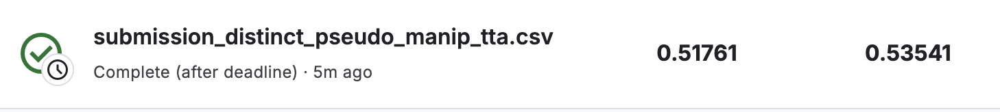

#Создание базовой модели

In [19]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Используем устройство:", device)

Используем устройство: mps


In [23]:
model = create_model("swin_base_patch4_window7_224", pretrained=True, num_classes=len(base_dataset_distinct_1.classes))
model = model.to(device)

In [24]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=1)


#Тренировка и валидация

In [25]:
def train(model, train_loader, criterion, optimizer, scheduler, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        start_time = time.time()
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        train_accuracy = 100. * correct / total
        scheduler.step()
        epoch_time = time.time() - start_time
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader):.4f}, "
              f"Train Accuracy: {train_accuracy:.2f}%, Time per epoch: {epoch_time:.2f} sec")


In [26]:
def validate(model, val_loader):
    model.eval()
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_accuracy = 100. * val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}%")
    return val_accuracy

#Обучение

In [28]:
import random

In [ ]:
train(model, train_loader_distinct_1, criterion, optimizer, scheduler, num_epochs=6)
best_val_accuracy = validate(model, val_loader_distinct_1)
torch.save(model.state_dict(), "swin_base_patch4_model.pth")

In [ ]:
train(model, train_loader, criterion, optimizer, scheduler, num_epochs=6)
best_val_accuracy = validate(model, val_loader)
torch.save(model.state_dict(), "swin_base_patch4_model.pth")

#Загрузка тестовых данных и валидация решения

Проверка модели на тестовых данных